<h1 align="center">University of Washington Professional and Continuing Education</h1>
<h1 align="center">Big Data 230B Emerging Technologies In Big Data Final Project</h1>
<h2 align="center">Weather & Transportation: Streaming the Data, Finding Correlations</h2>
<h3 align="center">8/23/2017</h3>
<h3 align="center">Team D-Hawks: John Bever, Karunakar Kotha, Leo Salemann, Shiva Vuppala, Wenfan Xu</h3>

# Generating the Data
The data processed in this notebook came frome a set of python scripts using kafka. Three producres where run against the follow Web API's.

[Washington State Department of Transportation (WSDOT) Traffic Travel Times](http://wsdot.com/traffic/api/TravelTimes/TravelTimesREST.svc/help/operations/GetTravelTimesAsJson#response-json)

[WSDOT Weather](http://wsdot.com/traffic/api/WeatherInformation/WeatherInformationREST.svc/help/operations/GetCurrentWeatherForStationsAsJson)

[Yahoo Weather, via Yahoo Query Language (YQL)](https://developer.yahoo.com/yql/console/#h=select+*+from+weather.forecast+where+woeid%3D2502265)

Further Web API documentation can be found here:

[WSDOT](http://wsdot.com/traffic/api/)

[Yahoo YQL](https://developer.yahoo.com/yql/)

[WOEID (used for YQL to search by location)](http://www.woeidlookup.com/)

Another good resource for Web API's in general is www.programmableweb.com

Each producer would call its respective web API, then send the entire response (a JSON document) as a kfafka message. A corresondindg consumer script receeved the message and saved each json document as a seprate file.  This notebook reads the json files and forms pandas data frames.  Data is visualized in chart form with Altair, and as maps with an OpenStreetMap background using Folium.

# Exploring JSON Files

In this notebook was developed on a vagrant ubutnu desktop VM, so our home directory is /home/vagrant. We'll assme you've been running the kafka scripts for awhile, have accumulated some json files, and stored them in the following folder structure:

| Folder Path | Description |
|:------------|-------------|
|/home/vagrant/json/wsdot_weather | WA State Dept. of Trasnsportation Weather |
|/home/vagrant/json/wsdot_traffic | WA State Dept. of Transprotation Travel Times   |

To make life easier, here's a "jsondir" variable to store the location of your json files.  

In [1]:
jsondir = "/home/vagrant/json"

# WSDOT Traffic Data

There can be A LOT of files. So we'l list them in single column (ls -l) then display only the first bunch of them (| head)

In [2]:
!ls -1 $jsondir/wsdot_traffic | head

2017-08-13-23-39-28
2017-08-14-00-09-28
2017-08-14-00-39-28
2017-08-14-01-09-28
2017-08-14-01-39-28
2017-08-14-02-09-28
2017-08-14-02-39-28
2017-08-14-03-09-28
2017-08-14-03-39-28
2017-08-14-04-09-28


## Viewing a file

The raw json files are difficult to read, as they don't come with newlines. There's a brief peek using that same head command

In [ ]:
!head $jsondir/wsdot_traffic/2017-08-13-23-39-28

## Gearing up for some data engineering

Import the libraries we need (pandas, json, and a few friends).

In [4]:
import json
import pandas as pd
import os
from pandas.io.json import json_normalize

jsondir = "/home/vagrant/json"
wsdot_traffic_filepath = jsondir + "/wsdot_traffic/2017-08-13-23-39-28"

Open the json file with python and have a look

In [ ]:
with open(wsdot_traffic_filepath) as json_file:
  raw_json = json.load(json_file)

raw_json

Much more readable, now let's transoform it into a data frame.

In [ ]:
wsdot_traffic_df = json_normalize(raw_json)
wsdot_traffic_df

Looks pretty good, but you'll notice the TimeUpdated column has some extra characters that prevent it from being interpreted as a true date and time.

Let's have a closer look, acessing a specific column of the dataframe and using head() to return jsut the first few rows.

In [7]:
wsdot_traffic_df['TimeUpdated'].head()

0    /Date(1502667300000-0700)/
1    /Date(1502667300000-0700)/
2    /Date(1502667300000-0700)/
3    /Date(1502667300000-0700)/
4    /Date(1502667300000-0700)/
Name: TimeUpdated, dtype: object

Need to prune out some bad characters.

In [8]:
wsdot_traffic_df['TimeUpdated'] = wsdot_traffic_df['TimeUpdated'].str.strip('/Date()')
wsdot_traffic_df['TimeUpdated'].head()

0    1502667300000-0700
1    1502667300000-0700
2    1502667300000-0700
3    1502667300000-0700
4    1502667300000-0700
Name: TimeUpdated, dtype: object

Almost there; need to chop that _-700_ off the end.

In [9]:
wsdot_traffic_df['TimeUpdated'] = wsdot_traffic_df['TimeUpdated'].str.split('-').str[0]
wsdot_traffic_df['TimeUpdated'].head()

0    1502667300000
1    1502667300000
2    1502667300000
3    1502667300000
4    1502667300000
Name: TimeUpdated, dtype: object

Ok, We've got a raw time stamp. Let's parse it into something human-readable

In [10]:
import datetime
wsdot_traffic_df['Timestamp'] = wsdot_traffic_df['TimeUpdated'].apply(
    lambda x: datetime.datetime.fromtimestamp(int(x)/1000 - 7 * 3600).strftime('%Y-%m-%d %H:%M:%S'))

wsdot_traffic_df['Timestamp'].head()

0    2017-08-13 09:35:00
1    2017-08-13 09:35:00
2    2017-08-13 09:35:00
3    2017-08-13 09:35:00
4    2017-08-13 09:35:00
Name: Timestamp, dtype: object

Looks pretty, but python/pandas doesn't recognize it as a datetime; still thinks it's just an object.  One more comand ...

In [11]:
wsdot_traffic_df['Timestamp'] = pd.to_datetime(wsdot_traffic_df['Timestamp'])
wsdot_traffic_df['Timestamp'].head()

0   2017-08-13 09:35:00
1   2017-08-13 09:35:00
2   2017-08-13 09:35:00
3   2017-08-13 09:35:00
4   2017-08-13 09:35:00
Name: Timestamp, dtype: datetime64[ns]

Review the whole dataframe again (sroll right to see the new TimeSTamp

In [ ]:
wsdot_traffic_df

and the datatypes ...

In [ ]:
wsdot_traffic_df.dtypes

Pretty good.  The only objects left are strings.

## Make a function to auto-cleanse the WSDOT  datafames

In [14]:
# ----------------------------------------------------------------------
# FUNCTION: cleanseWSDOTtraffic
#   inputs: normalized dataframe, name of field to cleans
#  oytputs: same dataframe, with a new field that contains cleansed data, in datetime format.
import json
import pandas as pd
import os
from pandas.io.json import json_normalize
import datetime

def cleanseWSDOTdate(in_wsdot_traffic_df, Fieldname):
    in_wsdot_traffic_df[Fieldname] = in_wsdot_traffic_df[Fieldname].str.strip('/Date()')
    in_wsdot_traffic_df[Fieldname] = in_wsdot_traffic_df[Fieldname].str.split('-').str[0]
    
    NewFieldName = Fieldname+"_timestamp"
    
    in_wsdot_traffic_df[NewFieldName] = in_wsdot_traffic_df[Fieldname].apply(
      lambda x: datetime.datetime.fromtimestamp(int(x)/1000 - 7 * 3600).strftime('%Y-%m-%d %H:%M:%S'))

    in_wsdot_traffic_df[NewFieldName] = pd.to_datetime(in_wsdot_traffic_df[NewFieldName])
    return in_wsdot_traffic_df

Read another file, cleanse, inspect.

In [ ]:
import json
import pandas as pd
import os
from pandas.io.json import json_normalize

jsondir = "/home/vagrant/json"
next_wsdot_traffic_filepath = jsondir + "/wsdot_traffic/2017-08-14-00-09-28"

with open(next_wsdot_traffic_filepath) as json_file:
  raw_json = json.load(json_file)

next_wsdot_traffic_df = json_normalize(raw_json)
clean_wsdot_traffic_df = cleanseWSDOTdate(next_wsdot_traffic_df, 'TimeUpdated')
clean_wsdot_traffic_df

Inspect the datatypes.

In [ ]:
clean_wsdot_traffic_df.dtypes

## Iterate over all WSDOT json files, assemble one large dataframe

In [ ]:
top_folder = jsondir + "/wsdot_traffic"
first_time = True

for filename in os.listdir(top_folder):
    filepath = top_folder + "/" + filename

    with open(filepath) as json_file:
      raw_json = json.load(json_file)

    new_df = json_normalize(raw_json)
    
    if (first_time):
        first_time = False
        multi_traffic_df = new_df
    else:
        multi_traffic_df = multi_traffic_df.append(new_df, ignore_index=True)
    
clean_multi_traffic_df = cleanseWSDOTdate(multi_traffic_df, 'TimeUpdated')
clean_multi_traffic_df

In [112]:
clean_multi_traffic_df.shape

(70998, 20)

# WSDOT Weather Data
The WSDOT Weather JSON files have a very similar structure to the traffic ones, so the processing pipeline is aobut the same. We're going to skip a few steps for brevity here.  If you'd like to see a more gradual exploration of the data, scroll back up to the section on *WSDOT Traffice Data*

As before, get our bearings by listing the directory and reading a file.  We'll through in a couple _echo_ commands for some whitespace.

In [ ]:
!ls -1 $jsondir/wsdot_weather | head

! echo ""
! echo ""

!head $jsondir/wsdot_weather/2017-08-13-23-37-10

## Gearing up for some data engineering

Import the libraries we need (pandas, json, ad a few friends).

_these same libraries were imported earlier for WSOT transportation, but we repeat them here in case you'd like to copy/paste into a a notebook of your own._

In [ ]:
import json
import pandas as pd
import os
from pandas.io.json import json_normalize

jsondir = "/home/vagrant/json"
wsdot_weather_filepath = jsondir + "/wsdot_weather/2017-08-13-23-37-10"

with open(wsdot_weather_filepath) as json_file:
  raw_json = json.load(json_file)

raw_json

We've proved that we have readable json; let's convert it into a dataframe

In [ ]:
wsdot_weather_df = json_normalize(raw_json)
wsdot_weather_df

Sure enough, same Date-time problem as the traffic file. We'll (re) use the _CleanseWSDOTTraffic()_ function we wrote above, after iterating over all files in the wsdot_weather folder to make one big dataframe (that we only need to cleanse once).

In [ ]:
clean_wsdot_weather_df = cleanseWSDOTdate(wsdot_weather_df, 'ReadingTime')
clean_wsdot_weather_df

## Iterate over all WSDOT json files, assemble one large dataframe

In [ ]:
top_folder = jsondir + "/wsdot_weather"
first_time = True

for filename in os.listdir(top_folder):
    filepath = top_folder + "/" + filename

    # print ("about to read " + filename)
    with open(filepath) as json_file:
      raw_json = json.load(json_file)

    new_df = json_normalize(raw_json)
    
    if (first_time):
        first_time = False
        multi_wsdot_weather_df = new_df
    else:
        multi_wsdot_weather_df = multi_wsdot_weather_df.append(new_df, ignore_index=True)

clean_multi_wsdot_weather_df = cleanseWSDOTdate(multi_wsdot_weather_df, 'ReadingTime')
clean_multi_wsdot_weather_df

In [113]:
clean_multi_wsdot_weather_df.shape

(40931, 16)

# Do some simple plots with Altair

Start with some preliminary setup, per the [Altair github page](https://github.com/jakevdp/altair)

In [23]:
from altair import Chart, load_dataset

In [123]:
clean_multi_wsdot_weather_df.shape

(40931, 16)

In [137]:
import numpy as np
chosen_idx = np.random.choice(40931, replace=False, size=6000)

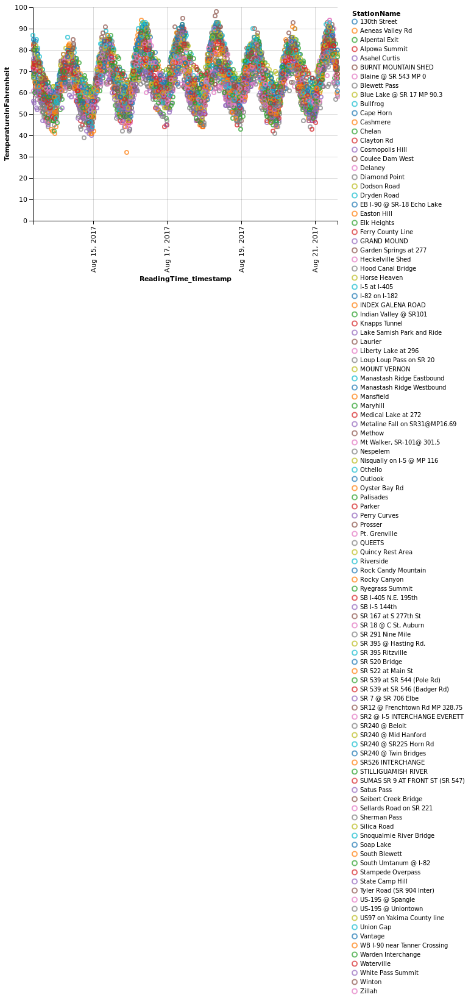

In [138]:
# NOTE.  This cell will raise a deprecaton warning on the first run,  but if you run it a secondd time it wil work.
chart = Chart(clean_multi_wsdot_weather_df.iloc[chosen_idx]).mark_point().encode(
    x= 'ReadingTime_timestamp',
    y='TemperatureInFahrenheit',
    color='StationName',
)
chart


Plot temperature for just one station, switching from circle to line graph.

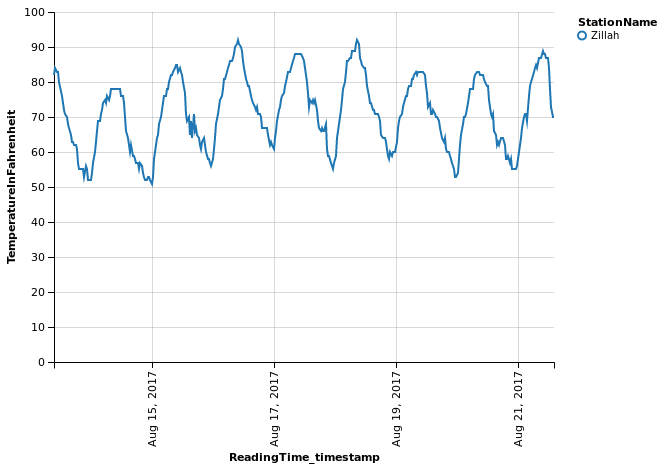

In [25]:
chart = Chart(clean_multi_wsdot_weather_df.loc[clean_multi_wsdot_weather_df['StationName'] 
                                         == 'Zillah']).mark_line().encode(
    x= 'ReadingTime_timestamp',
    y='TemperatureInFahrenheit',
    color='StationName',
)
chart


In [139]:
clean_multi_traffic_df.shape

(70998, 20)

In [156]:
import numpy as np
chosen_idx = np.random.choice(70998, replace=False, size=4000)

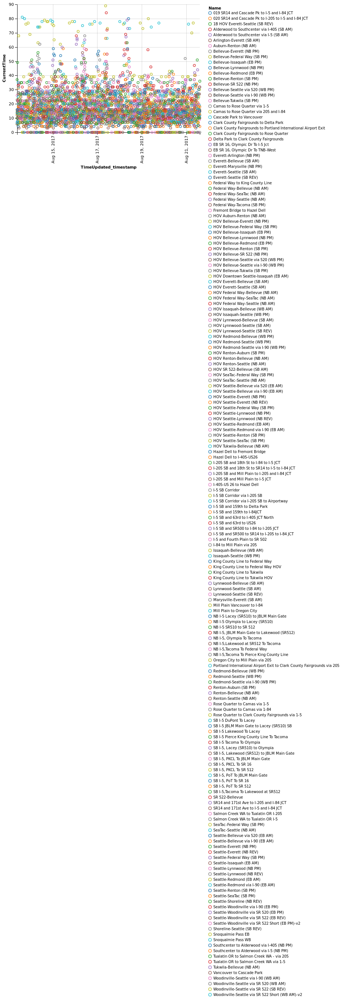

In [157]:
# NOTE: The traffic dataset is very large, so use this to start the jupyter server.
# jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000
chart = Chart(clean_multi_traffic_df.iloc[chosen_idx]).mark_point().encode(
    x= 'TimeUpdated_timestamp',
    y='CurrentTime',
    color='Name',
)
chart

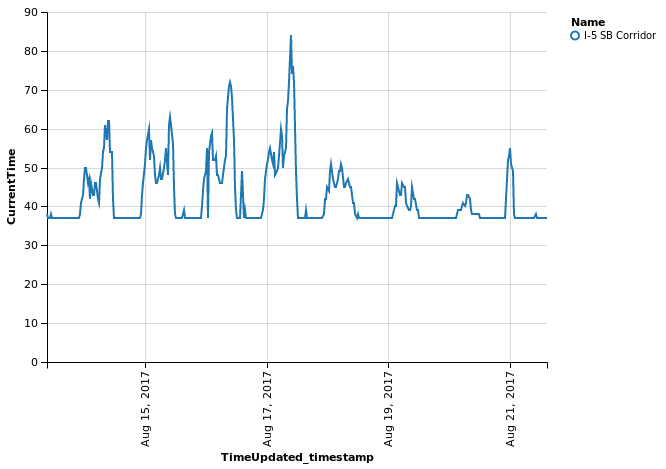

In [27]:
# NOTE: The traffic dataset is very large, so use this to start the jupyter server.
# jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000
# Bellevue-Issaquah (EB PM)
chart = Chart(clean_multi_traffic_df.loc[clean_multi_traffic_df['Name'] 
                                         == 'I-5 SB Corridor']).mark_line().encode(
    
    x= 'TimeUpdated_timestamp',
    y='CurrentTime',
    color='Name',
)
chart

# Mapping with Folium

Start with a simple base map

In [119]:
import folium
map_osm = folium.Map(location=[46.3013, -120.3126], zoom_start=7)
map_osm.save('osm.html')
map_osm

Reload a _single_ traffic and weather json file.  Each file has the same spatial data, so it would be redundtant to plot them all. 

In [ ]:
import json
import pandas as pd
import os
from pandas.io.json import json_normalize

jsondir = "/home/vagrant/json"
wsdot_traffic_filepath = jsondir + "/wsdot_traffic/2017-08-13-23-39-28"

with open(wsdot_traffic_filepath) as json_file:
  raw_json = json.load(json_file)

raw_json

wsdot_traffic_df = json_normalize(raw_json)
wsdot_traffic_df

In [ ]:
import json
import pandas as pd
import os
from pandas.io.json import json_normalize

jsondir = "/home/vagrant/json"
wsdot_weather_filepath = jsondir + "/wsdot_weather/2017-08-13-23-37-10"

with open(wsdot_weather_filepath) as json_file:
  raw_json = json.load(json_file)

wsdot_weather_df = json_normalize(raw_json)
wsdot_weather_df

Set up the libraries we need, center the map on the average (i.e. midpoint) of our traffic data.

In [31]:
import folium
import numpy as np
from folium.plugins import MarkerCluster

lats = wsdot_traffic_df['StartPoint.Latitude']
lons = wsdot_traffic_df['StartPoint.Longitude']

map_center_lat = np.mean(lats)
map_center_lon = np.mean(lons)

map_osm = folium.Map(location=[map_center_lat, map_center_lon], zoom_start=7)

Iterate over the traffic data, add each traffic point.

In [32]:

for index, row in wsdot_traffic_df.iterrows():
    lat = row['StartPoint.Latitude']
    lon = row['StartPoint.Longitude']
    LatLonStr = "(%f, %f)" % (lat, lon)
    
    thePopUp = "Traffic Sensor: " + row['Name'] + " " + LatLonStr
    folium.CircleMarker([lat, lon], popup=thePopUp, color='#555555', fill_color='#555555', radius=5).add_to(map_osm)


Iterate over the weather data, add each traffic point.

In [33]:

for index, row in wsdot_weather_df.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    LatLonStr = "(%f, %f)" % (lat, lon)
                              
    thePopUp = "Weather Sensor: " + row['StationName'] + " " + LatLonStr
    folium.CircleMarker([lat, lon], popup=thePopUp, color='#3186cc', fill_color='#3186cc', radius=5).add_to(map_osm)


display the map!

In [34]:
map_osm

 # Getting Weather for Portland
 
One of the main things the map teaches us, is the distribution of weather stations vs. traffic sensors.
Weather stations are distributed all thought the state; traffic sensors are clustered along the I-5 cooridor between Everett and Olympia, wieth a few more along I-90, and a cluster in Portland.

Also note the absence of weather stations in Portland.  We can fix that by pulling in JSON from another weather service.

In [ ]:
!head $jsondir/yahoo_weather/2017-08-21-02-10-33

Load a sample yahoo json file

In [36]:
yahoo_weather_filepath = jsondir + "/yahoo_weather/2017-08-21-02-10-33"
yahoo_weather_folder = jsondir + "/yahoo_weather"

In [ ]:
with open(yahoo_weather_filepath) as json_file:
   raw_json = json.load(json_file)

raw_json

In [38]:
yahoo_weather_df = pd.read_json(yahoo_weather_filepath)
yahoo_weather_df

,query
count,1
created,2017-08-21T02:10:33Z
diagnostics,"{'service-time': '4', 'user-time': '6', 'publi..."
lang,en-US
results,{'channel': {'title': 'Yahoo! Weather - Portla...


As you can see, the yahoo json is very hiearchical. Let's take a look at query.results.

In [39]:
with open(yahoo_weather_filepath) as json_file:
  raw_json = json.load(json_file)

yahoo_weather_df = json_normalize(raw_json['query']['results']) 
yahoo_weather_df

,channel.astronomy.sunrise,channel.astronomy.sunset,channel.atmosphere.humidity,channel.atmosphere.pressure,channel.atmosphere.rising,channel.atmosphere.visibility,channel.description,channel.image.height,channel.image.link,channel.image.title,...,channel.location.region,channel.title,channel.ttl,channel.units.distance,channel.units.pressure,channel.units.speed,channel.units.temperature,channel.wind.chill,channel.wind.direction,channel.wind.speed
0,6:17 am,8:10 pm,39,1008.0,0,16.1,"Yahoo! Weather for Portland, OR, US",18,http://weather.yahoo.com,Yahoo! Weather,...,OR,"Yahoo! Weather - Portland, OR, US",60,mi,in,mph,F,81,335,14


In [ ]:
yahoo_weather_df.dtypes

In [ ]:
# source: https://stackoverflow.com/questions/15891038/pandas-change-data-type-of-columns
yahoo_weather_df = yahoo_weather_df.apply(pd.to_numeric, errors='ignore')
yahoo_weather_df.dtypes

In [ ]:
yahoo_weather_df['channel.item.condition.date'] = pd.to_datetime(yahoo_weather_df['channel.item.condition.date'])
yahoo_weather_df.dtypes

In [43]:
for index, row in yahoo_weather_df.iterrows():
    lat = row['channel.item.lat']
    lon = row['channel.item.long']
    LatLonStr = "(%f, %f)" % (lat, lon)
                              
    thePopUp = row['channel.title'] + " " + LatLonStr
    folium.CircleMarker([lat, lon], popup=thePopUp, color='#3186cc', fill_color='#3186cc', radius=5).add_to(map_osm)

map_osm

In [ ]:
top_folder = jsondir + "/yahoo_weather"
first_time = True

for filename in os.listdir(top_folder):
    filepath = top_folder + "/" + filename

    # print ("about to read " + filename)
    with open(filepath) as json_file:
      raw_json = json.load(json_file)

    new_df = json_normalize(raw_json['query']['results'])
    
    if (first_time):
        first_time = False
        multi_yahoo_weather_df = new_df
    else:
        multi_yahoo_weather_df = multi_yahoo_weather_df.append(new_df, ignore_index=True)

multi_yahoo_weather_df = multi_yahoo_weather_df.apply(pd.to_numeric, errors='ignore')
multi_yahoo_weather_df['channel.item.condition.date'] =  pd.to_datetime(multi_yahoo_weather_df['channel.item.condition.date'])
multi_yahoo_weather_df

In [114]:
multi_yahoo_weather_df.shape

(54, 39)

# Merging Weather Data
We have weather data from two different sources - Yahoo and WSDOT. To merge them in a meaninful way, we need to find common fields, and use them to constructe a new merged dataframe. 

From WSDOOT we have:

In [ ]:
clean_multi_wsdot_weather_df.dtypes

... and from Yahoo

In [ ]:
multi_yahoo_weather_df.dtypes

Assembling common fields across both data frames gives us:

|WSDOT                      |Yahoo                          |
|--------------------------:|:------------------------------|
| StationName               | channel.title                 |
| Latitude                  | channel.item.lat              |
| Longitude                 | channel.item.long             |
| ReadingTime_timestamp     | channel.item.condition.date   |
| BarometricPressure        | channel.atmosphere.pressure   |
| RelativeHumidity          | channel.atmosphere.humidity   |
| TemperatureInFahrenheit   | channel.item.condition.temp   |
| WindDirection             | channel.wind.direction        |
| WindSpeedInMPH            | channel.wind.speed            |
| Visibility                | channel.atmosphere.visibility |

The Yahoo dataframe is only one row, so we'll start with that one. Select the columns we want, then rename them to match the WSDOT dataframe

In [ ]:
merged_weather_df = multi_yahoo_weather_df[['channel.title', 
                                      'channel.item.lat', 
                                      'channel.item.lat',
                                      'channel.item.condition.date',
                                      'channel.atmosphere.pressure',
                                      'channel.atmosphere.humidity',
                                      'channel.item.condition.temp',
                                      'channel.wind.direction',
                                      'channel.wind.speed',
                                      'channel.atmosphere.visibility'
                                     ]]

merged_weather_df.columns = ['StationName', 
                             'Latitude', 
                             'Longitude',
                             'ReadingTime_timestamp',
                             'BarometricPressure',
                             'RelativeHumidity',
                             'TemperatureInFahrenheit',
                             'WindDirection',
                             'WindSpeedInMPH',
                             'Visibility'                             
                            ]

merged_weather_df.head()

In [ ]:
merged_weather_df = merged_weather_df.append(clean_multi_wsdot_weather_df[['StationName', 
                                                               'Latitude', 
                                                               'Longitude',
                                                               'ReadingTime_timestamp',
                                                               'BarometricPressure',
                                                               'RelativeHumidity',
                                                               'TemperatureInFahrenheit',
                                                               'WindDirection',
                                                               'WindSpeedInMPH',
                                                               'Visibility'
                                                              ]])


merged_weather_df

In [ ]:
merged_1file_weather_df = yahoo_weather_df[['channel.title', 
                                      'channel.item.lat', 
                                      'channel.item.lat',
                                      'channel.item.condition.date',
                                      'channel.atmosphere.pressure',
                                      'channel.atmosphere.humidity',
                                      'channel.item.condition.temp',
                                      'channel.wind.direction',
                                      'channel.wind.speed',
                                      'channel.atmosphere.visibility'
                                     ]]

merged_1file_weather_df.columns = ['StationName', 
                             'Latitude', 
                             'Longitude',
                             'ReadingTime_timestamp',
                             'BarometricPressure',
                             'RelativeHumidity',
                             'TemperatureInFahrenheit',
                             'WindDirection',
                             'WindSpeedInMPH',
                             'Visibility'                             
                            ]

merged_1file_weather_df = merged_1file_weather_df.append(clean_wsdot_weather_df[['StationName', 
                                                               'Latitude', 
                                                               'Longitude',
                                                               'ReadingTime_timestamp',
                                                               'BarometricPressure',
                                                               'RelativeHumidity',
                                                               'TemperatureInFahrenheit',
                                                               'WindDirection',
                                                               'WindSpeedInMPH',
                                                               'Visibility'
                                                              ]])

merged_1file_weather_df

# Merging Traffic  and Weather

We want to make a dataframe in which each row has traffic and weather data. We learned from mapping, that the traffic points are clustered on a few major freeways (I-5), while the weather points are scattered across the state. In order to make a meaninful data frame, each row will have the data from ne row out of the traffic dataframe, _plus_ the weather coluns from a weather dataframe row that has a _similar_ position and time stamp.  In other words, each row shall have 

- Traffic conditions at a specfic location, date, and time
- Weather conditions from  a _nearby_ weather station at a _simlar_ date and time

## Merging Traffic and Weather, pseudo code

## Function to filter by spatial bounding box

In [50]:
# ----------------------------------------------------------------------
# FUNCTION: filter_by_bbox
#   inputs: dataframe, columns names, coordinates, boundgin box size.
#  outputs: new dataframe, containing only those rows whos latitude and longitude fit within the bbox.
# ----------------------------------------------------------------------

import pandas as pd

def filter_by_bbox(df, LATcolumn, LONcolumn, LATvalue, LONvalue, BBoxSize):
    # Set up the bbox variables
    lat_sml_enough = df[LATcolumn] <= LATvalue + BBoxSize
    lat_big_enough = df[LATcolumn] >= LATvalue - BBoxSize
    lon_sml_enough = df[LONcolumn] <= LONvalue + BBoxSize
    lon_big_enough = df[LONcolumn] >= LONvalue - BBoxSize

    return df[lat_sml_enough & lat_big_enough & lon_sml_enough & lon_big_enough]

## Testing the Spatial  Filter Function

Grab the location data form the first row of the cleaned WSDOT traffic data frame. 

In [51]:
FilterLat = clean_multi_traffic_df['EndPoint.Latitude'].iloc[0]
FilterLon = clean_multi_traffic_df['EndPoint.Longitude'].iloc[0]

print (FilterLat)
print (FilterLon)

47.609294
-122.331759


Filter the dataframe for rows that are within 0.2 degrees of the first rrow.
Print the row-count of the result

In [52]:
filtered_wsdot_draffic_df  = filter_by_bbox(clean_multi_traffic_df, 
                                            'EndPoint.Latitude', 
                                            'EndPoint.Longitude',
                                          FilterLat, FilterLon,
                                           0.2)
len (filtered_wsdot_draffic_df.index)

28440

Compare the rowcount of the original dataframe

In [53]:
len(clean_multi_traffic_df.index)

70998

## Function to filter by timesamp

In [54]:
# ----------------------------------------------------------------------
# FUNCTION: filter_by_datetime
#   inputs: dataframe, name of datetime column, datetime value, 
#           optional args for timebox size in weeks, days, hours, minutes, second.
#  outputs: new dataframe, containing only those rows whos timesamp fits within the delta
# ----------------------------------------------------------------------
import pandas as pd
import datetime as dt

def filter_by_datetime(df, dt_column, dt_value,
                       delta_weeks=0, 
                       delta_days=0, 
                       delta_hours=0, 
                       delta_minutes=0, 
                       delta_seconds=0):

    timebox_upper = dt_value + dt.timedelta(weeks   = delta_weeks, 
                                                days    = delta_days,
                                                hours   = delta_hours,
                                                minutes = delta_minutes,
                                                seconds = delta_seconds)

    timebox_lower = dt_value - dt.timedelta(weeks   = delta_weeks, 
                                                days    = delta_days,
                                                hours   = delta_hours,
                                                minutes = delta_minutes,
                                                seconds = delta_seconds)

    within_timebox_upper = df[dt_column] <= timebox_upper
    within_timebox_lower = df[dt_column] >= timebox_lower
    
    return df[within_timebox_upper & within_timebox_lower]

## Testing the timesamp  Filter Function

Grab the timestamp form the first row of the Merged Weather dataframe (i.e. the onw with WSDOT and Yahoo weather in it.)

In [55]:
time1 = merged_weather_df['ReadingTime_timestamp'].iloc[0]
time1

Timestamp('2017-08-21 10:00:00')

Filter the dataframe for rows that occured in the same hour. Print the row-count of the result

In [56]:
timefiltered_weather = filter_by_datetime(merged_weather_df, 'ReadingTime_timestamp', time1, delta_hours=1)
len(timefiltered_weather.index)

408

Compare to the unfiltered record counts.

In [57]:
len(merged_weather_df.index)

40985

# Doing the Actual merge

In [ ]:
clean_multi_traffic_df.dtypes

In [59]:
merged_weather_df.dtypes

StationName                        object
Latitude                          float64
Longitude                         float64
ReadingTime_timestamp      datetime64[ns]
BarometricPressure                float64
RelativeHumidity                  float64
TemperatureInFahrenheit           float64
WindDirection                     float64
WindSpeedInMPH                    float64
Visibility                         object
dtype: object

In [ ]:
clean_wsdot_traffic_df.dtypes

In [ ]:
found_records = 0

# Iterate over the traffic rows
for index, row in clean_wsdot_traffic_df.iterrows():
    # gather some variables
    rowLat = row['StartPoint.Latitude']
    rowLon = row['StartPoint.Longitude']
    rowDateTime = row['TimeUpdated_timestamp']
    
    # find nearby weather readings
    nearby_weather  = filter_by_bbox(merged_weather_df, 'Latitude', 'Longitude', rowLat, rowLon, 0.2)
    
    # of the neraby readings, find thos which happened within 4 hours of the traffic data
    near_and_sametime_weather = filter_by_datetime(nearby_weather, 'ReadingTime_timestamp', rowDateTime, delta_minutes=15)
    
    records_found = len(near_and_sametime_weather.index)
    if (records_found > 0):
        print (records_found)
        found_records = found_records + 1
        
print ("-------")
print (len(clean_wsdot_traffic_df.index))
print (found_records)

# Dial in the timebox
# 0.2 deg; 4 hours 135 of 180, 30's 10's, 20's
# 0.2 deg; 1 hours 135 of 180, 4's 8's, 12's
# 0.2 deg; 30 min 135 of 180, 4's 8's, 12's
# 0.2 deg; 5 min 124 of 180, 2's and 3's
# 0.2 deg; 10 min 134 of 180, 2's and 3's
# 0.2 deg; 15 min 135 of 180, 2's and 5's

# 2's ad 5's pretty good; no need to dial in further on spatial sid.

    

In [ ]:
first_time = True
processed_rows = 0
processed_thousands = 0

# Iterate over the traffic rows from a single wsdot json file.
for index, traffic_onefile_row in clean_wsdot_traffic_df.iterrows():
    # Each row has a unigue location
    
    # Select rows from multi-file traffic,  based on TravelTimeID
    theTravelTimeID = traffic_onefile_row['TravelTimeID']
    filtered_traffic_byTravelTimeID_df = clean_multi_traffic_df.loc[
            clean_multi_traffic_df['TravelTimeID'] == theTravelTimeID]
    
    # Now we have filtered_traffic_byTravelTimeID_df, 
    # a bunch of traffic rows, all same location but different datetime 
    
    # Filter the weather data by spatial bbox, based on the traffic data
    rowLat = traffic_onefile_row['StartPoint.Latitude']
    rowLon = traffic_onefile_row['StartPoint.Longitude']
    bbox_halfsize_degrees = 0.2
    
    nearby_weather_df  = filter_by_bbox(merged_weather_df, 'Latitude', 'Longitude', 
                                     rowLat, rowLon, bbox_halfsize_degrees)
    
    # print(nearby_weather_df)
   
    # Now we have nearby_weather_df, a collection of weather records, both form WSDOT and Yahoo,
    # in roughly the same location as the current traffic row.

    # fastest way to get a record count
    # source: https://stackoverflow.com/questions/15943769/how-do-i-get-the-row-count-of-a-pandas-dataframe
    records_found = nearby_weather_df.shape[0]
    
    if (records_found > 0):
        # Now you have a bunch of weather records and traffic records in the same location, but both
        # vary by time
        
        # iterate over the selected traffic records
        for i2, filtered_traffic_row in filtered_traffic_byTravelTimeID_df.iterrows():
            # Find weather records in the same timeframe
            
            rowDateTime = filtered_traffic_row['TimeUpdated_timestamp']
            
            # Of the nearby readings, find those which happened within 15 minutes of the traffic data
            near_and_sametime_weather_df = filter_by_datetime(nearby_weather_df, 
                                                           'ReadingTime_timestamp', 
                                                           rowDateTime, delta_minutes=15)            
     
            # Now we have near_and_sametime_weather_df, a set of weather data which aligns to the 
            # same space and time as the crrent traffic row
             
            # fastest way to get a record count
            # source: https://stackoverflow.com/questions/15943769/how-do-i-get-the-row-count-of-a-pandas-dataframe
            weather_records_found = near_and_sametime_weather_df.shape[0]
                 
            # If we found any records, grab the first one and make a new dataframe
            if (weather_records_found > 0):
              
                weather_1row_df = near_and_sametime_weather_df.iloc[[0]].reset_index(drop=True)
                traffic_1row_df = pd.DataFrame([filtered_traffic_row]).reset_index(drop=True)
                  
                if (first_time):
                    first_time = False
                    # source: https://pandas.pydata.org/pandas-docs/stable/merging.html
                    merged_traffic_weather_df = pd.concat([traffic_1row_df, weather_1row_df], 
                                                          axis=1, join_axes=[traffic_1row_df.index])


                else:
                    new_merged_row_df = pd.concat([traffic_1row_df, weather_1row_df], 
                                                          axis=1, join_axes=[traffic_1row_df.index])

                    merged_traffic_weather_df = merged_traffic_weather_df.append(new_merged_row_df)
                                                    
                processed_rows = processed_rows + 1
                                    
                if (processed_rows == 1000):
                    processed_thousands = processed_thousands + 1
                    processed_rows = 0
                    print(processed_thousands)
        
merged_traffic_weather_df

In [115]:
merged_traffic_weather_df.shape

(52975, 30)

In [ ]:
merged_traffic_weather_df.dtypes

In [117]:
merged_traffic_weather_df.describe()

,AverageTime,CurrentTime,Distance,EndPoint.Latitude,EndPoint.Longitude,EndPoint.MilePost,StartPoint.Latitude,StartPoint.Longitude,StartPoint.MilePost,TravelTimeID,Latitude,Longitude,BarometricPressure,RelativeHumidity,TemperatureInFahrenheit,WindDirection,WindSpeedInMPH
count,52975.000000,52975.000000,52975.000000,52975.000000,52975.000000,52975.000000,52975.000000,52975.000000,52975.000000,52975.000000,52975.000000,52975.000000,45720.000000,50403.000000,50845.000000,52844.000000,52844.000000
mean,17.074563,17.193771,14.266900,47.539409,-122.278633,100.559988,47.542048,-122.271978,100.772483,124.229070,47.496421,-122.255101,1007.520448,63.413309,66.010325,207.320263,3.146109
std,12.479495,12.720519,10.221312,0.241276,0.198895,72.298429,0.236383,0.198189,72.036815,120.398769,0.193569,0.206687,62.432078,17.089769,7.390346,128.307316,2.457561
min,0.000000,0.000000,0.000000,45.525600,-122.891484,0.110000,45.580300,-122.891484,0.110000,1.000000,45.569000,-123.033100,29.900000,1.000000,46.000000,0.000000,0.000000
25%,10.000000,10.000000,9.160000,47.334789,-122.331759,13.600000,47.334789,-122.331759,13.600000,34.000000,47.474800,-122.270400,1009.900000,51.000000,61.000000,85.000000,1.000000
50%,14.000000,14.000000,13.220000,47.609294,-122.269470,132.910000,47.609294,-122.269470,136.740000,77.000000,47.474800,-122.270400,1013.700000,63.000000,66.000000,245.000000,3.000000
75%,22.000000,22.000000,17.220000,47.613800,-122.188920,165.830000,47.613800,-122.188920,165.830000,266.000000,47.509000,-122.232946,1015.400000,77.000000,72.000000,325.000000,4.000000
max,78.000000,136.000000,78.560000,48.152323,-120.599140,302.170000,48.152323,-120.540695,205.870000,403.000000,48.204200,-120.427000,1022.700000,100.000000,86.000000,360.000000,23.000000


In [118]:
merged_traffic_weather_df[['AverageTime',
                    'CurrentTime',
                    'BarometricPressure',
                    'RelativeHumidity',
                    'TemperatureInFahrenheit',
                    'WindDirection',
                    'WindSpeedInMPH'
                    ]].describe()

,AverageTime,CurrentTime,BarometricPressure,RelativeHumidity,TemperatureInFahrenheit,WindDirection,WindSpeedInMPH
count,52975.000000,52975.000000,45720.000000,50403.000000,50845.000000,52844.000000,52844.000000
mean,17.074563,17.193771,1007.520448,63.413309,66.010325,207.320263,3.146109
std,12.479495,12.720519,62.432078,17.089769,7.390346,128.307316,2.457561
min,0.000000,0.000000,29.900000,1.000000,46.000000,0.000000,0.000000
25%,10.000000,10.000000,1009.900000,51.000000,61.000000,85.000000,1.000000
50%,14.000000,14.000000,1013.700000,63.000000,66.000000,245.000000,3.000000
75%,22.000000,22.000000,1015.400000,77.000000,72.000000,325.000000,4.000000
max,78.000000,136.000000,1022.700000,100.000000,86.000000,360.000000,23.000000


In [105]:
import numpy as np
chosen_idx = np.random.choice(52975, replace=False, size=2500)
# chosen_idx = np.random.choice(2752, replace=False, size=2752)
mini_df = merged_traffic_weather_df.iloc[chosen_idx]
mini_df2 = mini_df[['StationName',
                    'AverageTime',
                    'CurrentTime',
                    'Distance',
                    'EndPoint.Latitude',
                    'EndPoint.Longitude',
                    'EndPoint.MilePost',
                    'StartPoint.Latitude',
                    'StartPoint.Longitude',
                    'StartPoint.MilePost',
                    'Latitude',
                    'Longitude',
                    'BarometricPressure',
                    'RelativeHumidity',
                    'TemperatureInFahrenheit',
                    'WindDirection',
                    'WindSpeedInMPH'
                    ]]

In [106]:
mini_df2.describe()

,AverageTime,CurrentTime,Distance,EndPoint.Latitude,EndPoint.Longitude,EndPoint.MilePost,StartPoint.Latitude,StartPoint.Longitude,StartPoint.MilePost,Latitude,Longitude,BarometricPressure,RelativeHumidity,TemperatureInFahrenheit,WindDirection,WindSpeedInMPH
count,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2144.000000,2371.000000,2391.000000,2492.000000,2492.000000
mean,17.222400,17.394800,14.407552,47.539837,-122.275042,101.349788,47.544504,-122.267577,101.844188,47.497914,-122.252008,1005.926493,63.363981,66.141782,208.811396,3.120787
std,13.280945,13.505758,11.043247,0.245488,0.204887,72.333707,0.244759,0.222174,71.993014,0.200636,0.232372,74.046374,17.230026,7.306526,127.835351,2.421853
min,0.000000,0.000000,0.000000,45.525600,-122.891484,0.110000,45.580300,-122.891484,0.110000,45.569000,-123.033100,29.900000,1.000000,48.000000,0.000000,0.000000
25%,9.000000,9.000000,9.030000,47.323000,-122.331759,13.600000,47.334789,-122.331759,13.600000,47.474800,-122.270400,1009.900000,51.000000,61.000000,90.000000,1.000000
50%,14.000000,14.000000,13.030000,47.609294,-122.269470,132.910000,47.609294,-122.269470,136.740000,47.474800,-122.270400,1013.600000,63.000000,66.000000,250.000000,3.000000
75%,22.000000,23.000000,17.220000,47.613800,-122.188920,165.830000,47.613800,-122.188920,165.830000,47.509000,-122.207200,1015.500000,77.000000,72.000000,325.000000,4.000000
max,78.000000,86.000000,78.560000,48.152323,-120.599140,302.170000,48.152323,-120.540695,205.870000,47.980300,-120.427000,1021.800000,99.000000,86.000000,358.000000,13.000000


In [107]:
mini_df3 = mini_df2.dropna(how='any')
mini_df3.describe()

,AverageTime,CurrentTime,Distance,EndPoint.Latitude,EndPoint.Longitude,EndPoint.MilePost,StartPoint.Latitude,StartPoint.Longitude,StartPoint.MilePost,Latitude,Longitude,BarometricPressure,RelativeHumidity,TemperatureInFahrenheit,WindDirection,WindSpeedInMPH
count,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000
mean,17.059943,17.178402,14.173901,47.572580,-122.253043,102.099791,47.588006,-122.252387,102.043392,47.536927,-122.230254,1005.945195,63.144148,66.073264,210.099429,3.041389
std,11.973246,12.343453,9.307976,0.219134,0.186278,73.894924,0.203944,0.094664,74.236937,0.154306,0.079243,74.781488,17.060289,7.299558,127.375358,2.422467
min,0.000000,0.000000,0.000000,47.011288,-122.759508,0.110000,47.229950,-122.442040,0.110000,47.303516,-122.324000,29.900000,1.000000,48.000000,0.000000,0.000000
25%,10.000000,10.000000,9.410000,47.463303,-122.331759,13.600000,47.458000,-122.331759,13.600000,47.474800,-122.270400,1010.000000,51.000000,61.000000,90.000000,1.000000
50%,15.000000,15.000000,13.320000,47.609294,-122.265480,139.690000,47.609294,-122.265480,139.410000,47.474800,-122.270400,1013.700000,63.000000,65.000000,260.000000,3.000000
75%,23.000000,23.000000,17.220000,47.668087,-122.188920,165.830000,47.668087,-122.188920,165.830000,47.760633,-122.184048,1015.500000,77.000000,72.000000,325.000000,4.000000
max,78.000000,86.000000,74.900000,48.152323,-120.599140,205.870000,48.152323,-121.751422,205.870000,47.980300,-121.885000,1021.800000,98.000000,85.000000,355.000000,11.000000


/home/vagrant/anaconda3/envs/geopandas_pip_altiair/lib/python3.5/site-packages/numpy/lib/function_base.py:748: RuntimeWarning:

invalid value encountered in greater_equal

/home/vagrant/anaconda3/envs/geopandas_pip_altiair/lib/python3.5/site-packages/numpy/lib/function_base.py:749: RuntimeWarning:

invalid value encountered in less_equal



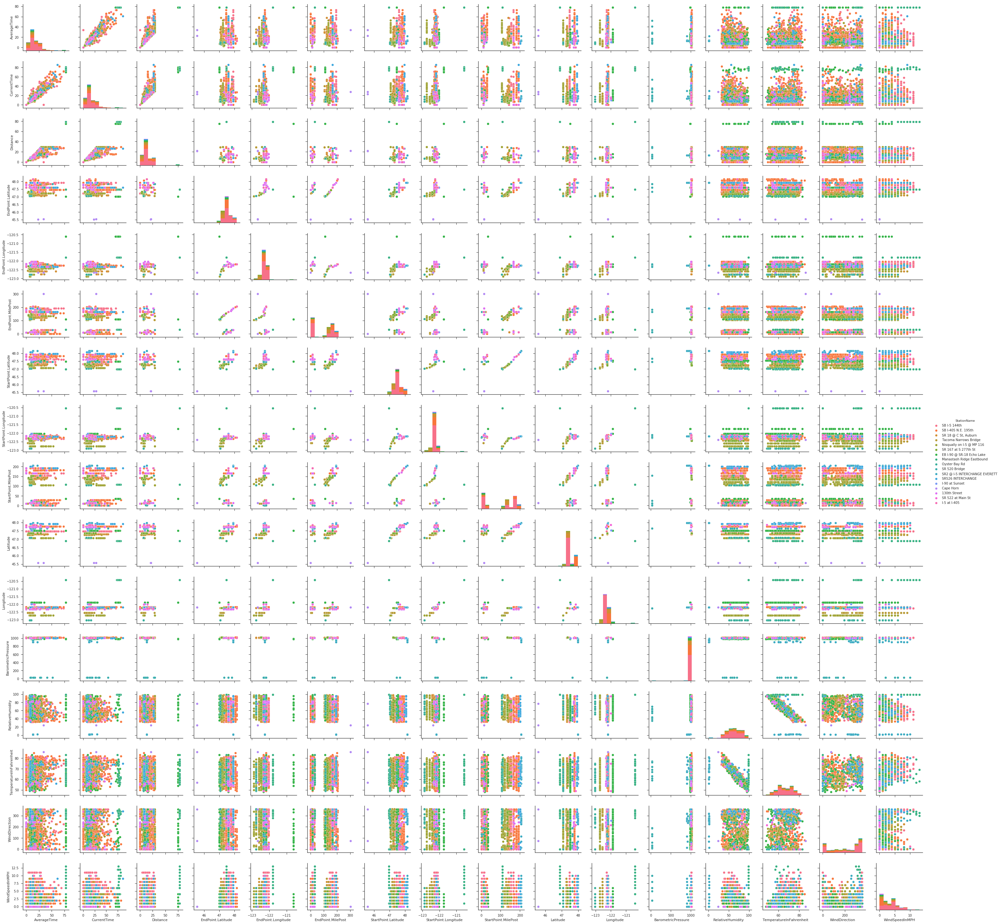

In [108]:
import seaborn as sns
sns.set(style="ticks")

sns.pairplot(mini_df2, hue="StationName")


/home/vagrant/anaconda3/envs/geopandas_pip_altiair/lib/python3.5/site-packages/numpy/lib/function_base.py:748: RuntimeWarning:

invalid value encountered in greater_equal

/home/vagrant/anaconda3/envs/geopandas_pip_altiair/lib/python3.5/site-packages/numpy/lib/function_base.py:749: RuntimeWarning:

invalid value encountered in less_equal



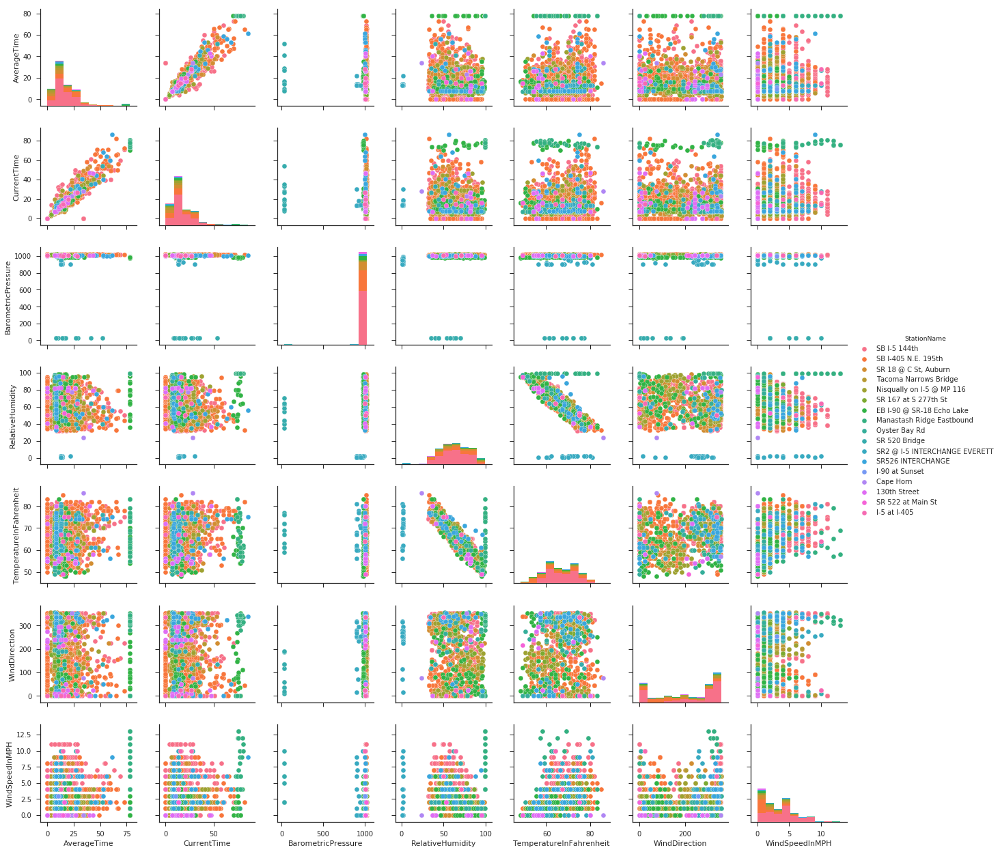

In [109]:
# something interesting in the last 5x5 columns
mini_df4 = mini_df[['StationName',
                    'AverageTime',
                    'CurrentTime',
                    'BarometricPressure',
                    'RelativeHumidity',
                    'TemperatureInFahrenheit',
                    'WindDirection',
                    'WindSpeedInMPH'
                    ]]

sns.pairplot(mini_df4, hue="StationName")